Welcome to JupyROOT 6.28/04
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001620_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001621_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001622_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001623_000.root
!!! spill 19, 0021 DQM = 0x1
!!! spill 20, 0022 DQM = 0x1
!!! spill 21, 0023 DQM = 0x1
!!! spill 22, 0024 DQM = 0x1
!!! spill 24, 0026 DQM = 0x1
!!! spill 25, 0027 DQM = 0x1
!!! spill 26, 0028 DQM = 0x1
!!! spill 27, 0029 DQM = 0x1
!!! spill 29, 0031 DQM = 0x1
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001624_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001625_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001626_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001627_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-004-000.001628_000.root
Reading f

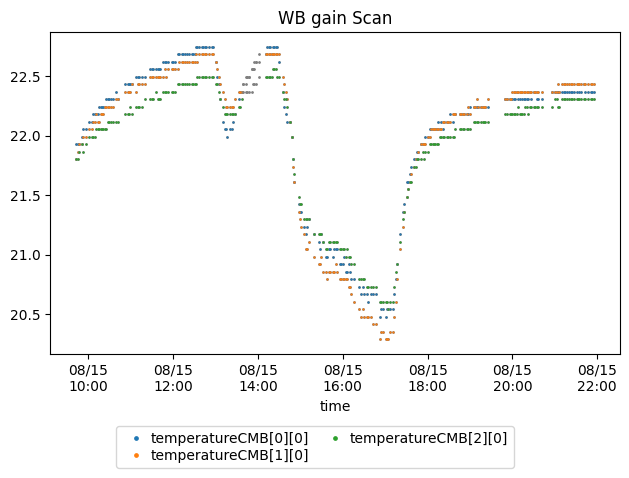

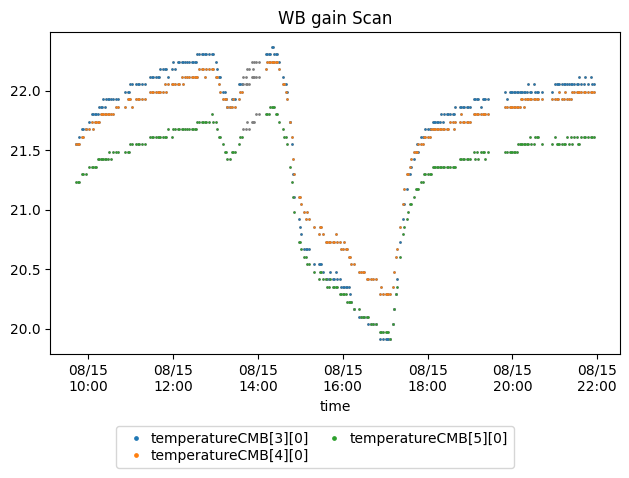

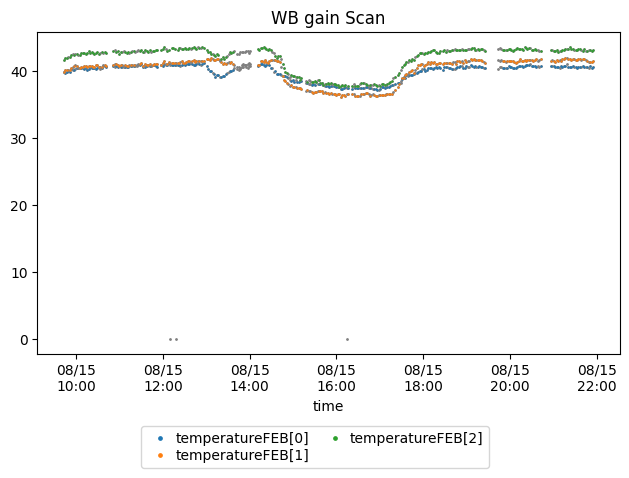

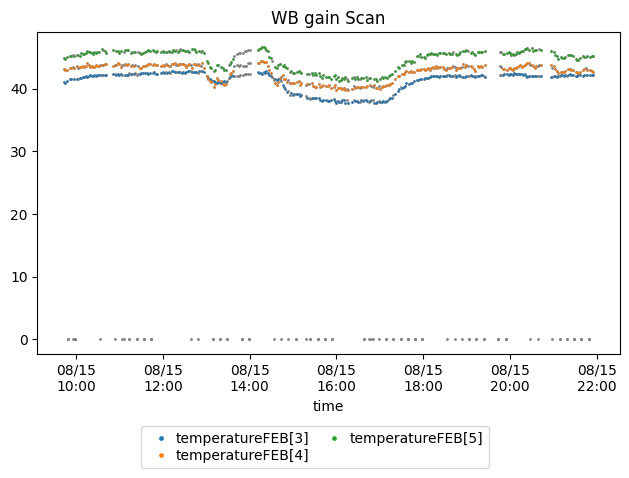

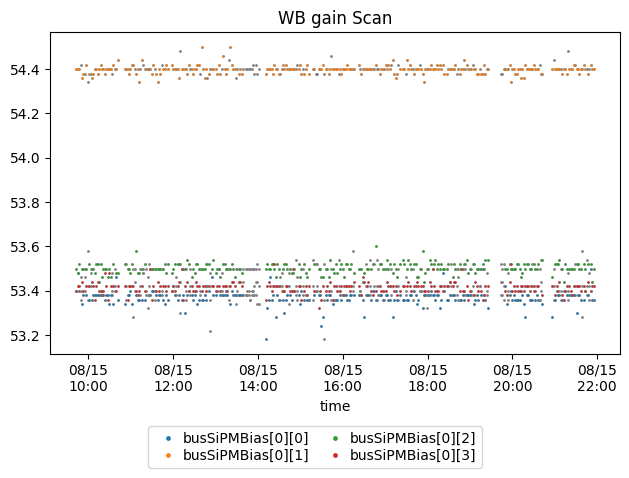

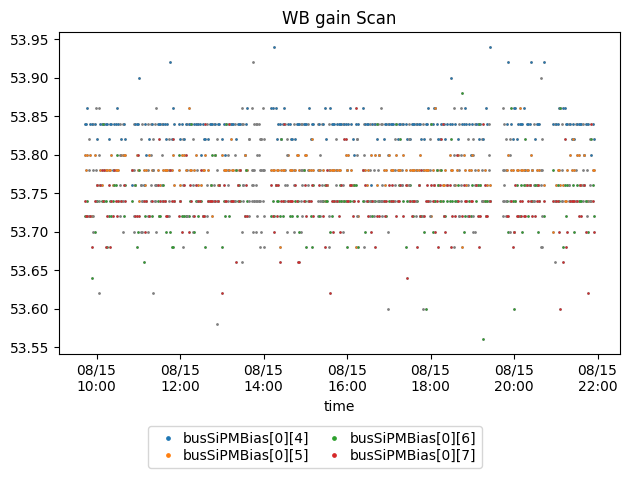

In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
%jsroot on
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array

import utils
import filepath

fileList = filepath.getfilelist(["gainAFEScan"],"recoROOT",4)[0]

nSmooth = 1 
tdict = {'*':[["temperatureCMB[0][0]","temperatureCMB[1][0]","temperatureCMB[2][0]"],
              ["temperatureCMB[3][0]","temperatureCMB[4][0]","temperatureCMB[5][0]"],
              ["temperatureFEB[0]","temperatureFEB[1]","temperatureFEB[2]"],
              ["temperatureFEB[3]","temperatureFEB[4]","temperatureFEB[5]"],
              ["busSiPMBias[0][0:4]"],
              ["busSiPMBias[0][4:8]"]]}
tfig = utils.plot_dqm(fileList, tdict, '==0x0', False, nSmooth, True, "WB gain Scan;time;") 

Ran 'gainAFEScanWB008.py' in console to geneerate DF.

In [2]:
from __future__ import print_function
import os, sys
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import pickle
from scipy.optimize import curve_fit

topdir = os.path.dirname(os.path.abspath("__file__"))
analysis_dir = os.path.join(topdir,"analysis_root_files")
pklname = os.path.join(analysis_dir,"gainAFEScanDF.pkl")

with open(pklname, 'rb') as f:
    df = pickle.load(f)
    
# remove runs with very low gain that failed SPE fittings. See gainAFEScan.pdf for details 
df = df.query("gainAFE != 0x800 & gainAFE != 0xc00").reset_index() 

display(df)

,index,run,subrun,gainAFE,FEB,ch,pedestal,calibRaw,calibRawErr,calibAdj1,calibAdj1Err,calibAdj2,calibAdj2Err,calibAdj3,calibAdj3Err,FEBtemp,CMBtemp,biasV
0,0,1620,0,0,0,0,-12.367300,1320.439727,1.364836,1331.480014,1.325692,1336.343855,1.301692,1362.948737,1.300338,40.335999,21.997396,53.382664
1,1,1620,0,0,0,1,16.616899,1335.457337,1.145709,1346.005681,1.145685,1349.925303,1.120299,1376.472405,1.114245,40.335999,21.997396,53.382664
2,2,1620,0,0,0,2,0.733254,1348.871975,1.281870,1359.295148,1.394454,1363.658007,1.275016,1390.723377,1.280005,40.335999,21.997396,53.382664
3,3,1620,0,0,0,3,-2.811010,1356.000064,1.288308,1367.172517,1.286801,1371.324419,1.281870,1398.315896,1.251752,40.335999,21.997396,53.382664
4,4,1620,0,0,0,4,-12.327100,1296.017459,1.377688,1306.127299,1.329798,1310.190718,1.335811,1336.867076,1.308137,40.335999,22.039062,53.382664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3451,4219,1630,0,768,5,59,-8.436370,464.520946,2.175230,473.915021,2.074080,474.432292,2.170153,478.579825,1.443437,45.140003,21.277174,53.771313
3452,4220,1630,0,768,5,60,15.282300,483.603135,1.471190,497.978426,1.426390,497.035749,1.667032,500.232089,1.527579,45.140003,21.752718,53.771313
3453,4221,1630,0,768,5,61,0.797164,484.971538,1.222473,499.785258,1.149701,499.244208,1.215134,503.468379,1.360106,45.140003,21.752718,53.771313
3454,4222,1630,0,768,5,62,0.147999,487.188158,1.391319,499.260981,1.109276,499.089441,1.114308,502.002838,1.084360,45.140003,21.752718,53.771313


In [3]:
import matplotlib.gridspec as gridspec

markers = ['v','o','s','>']

FEBs = df['FEB'].unique()
FEBs = np.sort(FEBs)
gainAFEs = df['gainAFE'].unique()
gainAFEs = np.sort(gainAFEs)
vAFEs = [float(val)/4096.*1.54 for val in gainAFEs]

bad_channels = []

def ratio2dB(val, ref):
    return 20.*np.log10(val/ref)

def func(x, a, b):
    return a*np.exp(b*x)

def plotter(yitem, title = '', nr = 4, nc = 4):
    global gainAFEs
    
    ch_array = []
    dBperV = []
    ratio_array = [[] for val in gainAFEs]
    
    maintitle = title
        
    for FEB in FEBs:
        fig = plt.figure(layout = 'constrained', figsize = (5*nc+0.5, 8.6*nr+0.5))
        plt.suptitle(maintitle+" FEB%i"%FEB)
        subfigs = fig.subfigures(nr, 1, hspace=0)
        
        for iRow, tSubFig in enumerate(subfigs):
            axs = tSubFig.subplots(3, nc, sharex='col', sharey='row',
                                   gridspec_kw={'width_ratios':[5 for i in range(nc)],
                                                'height_ratios':[3.5,1.6,3.5],
                                                'wspace':0, 'hspace':0})
            
            ytitles = ['SPE [ADC*ns/PE]', 'Data/Fit', 'Rel. Gain [dB]']
            for ii in range(3):
                axs[ii, 0].set_ylabel(ytitles[ii])
            for ii in range(nc):
                axs[2, ii].set_xlabel('$V_{AFE}$ [V]')
            
            for iColumn in range(nc):
                iHDMI = nc * iRow + iColumn
                for inHDMI_chan in range(4):
                    chan = iHDMI*4+inHDMI_chan
                    
                    df_ = df.query("FEB==%i & ch==%i"%(FEB, chan)).reset_index()
                    
                    x = df_['gainAFE'].astype(float)
                    x = x/4096.*1.54
                    
                    y = df_[yitem]
                    yerr = df_[yitem+'Err']
                    
                    mask = (y>0)

                    x=x[mask]
                    y=y[mask]
                    yerr = yerr[mask]
                    
                    if y.size==0:
                        print("Bad channel: %d"%(chan))
                        continue
                    if (FEB, chan) in bad_channels:
                        continue
                        
                    popt, pcov = curve_fit(func, x, y, sigma = yerr)
                    
                    ch_array.append(64*FEB+chan)
                    dBperV.append(popt[1]*20.*np.log10(np.e))
                    
                    tscaterr = axs[0, iColumn].errorbar(x, y, yerr, marker=markers[inHDMI_chan], linestyle='none', label='Chan %d, y = %.3f * exp[(%.3f $\pm$ %.3f) * x]'%(chan, popt[0], popt[1], np.sqrt(pcov[1,1])))
                    tcolor = tscaterr[0].get_color()
                    xx = np.linspace(np.min(x), np.max(x), 100)
                    yy = func(xx, popt[0], popt[1])
                    axs[0, iColumn].plot(xx, yy, '--', color=tcolor, linewidth=0.7)
                    
                    y_ratio = np.divide(y, func(x, popt[0], popt[1]))
                    for ii, tyratio in enumerate(y_ratio):
                        ratio_array[ii].append(tyratio)
                    yerr_ratio = np.divide(yerr, func(x, popt[0], popt[1]))
                    axs[1, iColumn].errorbar(x, y_ratio, yerr_ratio, marker=markers[inHDMI_chan], linestyle='none', color=tcolor)
                    axs[1, iColumn].axhline(y=1., color='k', linestyle='--')
                    
                    y_dB = ratio2dB(y, popt[0])
                    axs[2, iColumn].plot(x, y_dB, marker=markers[inHDMI_chan], linestyle='none', color=tcolor)
                    axs[2, iColumn].plot(xx, xx*popt[1]*20.*np.log10(np.e), '--', color=tcolor, linewidth=0.7, label='Chan %d, (%.3f $\pm$ %.3f) dB/V'%(chan, popt[1]*20.*np.log10(np.e), np.sqrt(pcov[1,1])*20.*np.log10(np.e)))
                    
                axs[0, iColumn].legend(fontsize='small')
                axs[1, iColumn].set_ylim(0.85,1.12)
                axs[2, iColumn].legend(fontsize='small')
                    
    return ch_array, dBperV, x, ratio_array

In [4]:
def displayItem(item, title):
    global gainAFEs
    
    plt.figure(figsize = (24,5))
    for gainAFE in gainAFEs:
        df_ = df.query("gainAFE==%i"%gainAFE).reset_index()
        plt.plot(np.add(df_['FEB']*64,df_['ch']), df_[item], '.-', label=('AFE gain: 0x%03x'%gainAFE))
    plt.title(title)
    plt.xlabel("Channel index")
    plt.ylabel("SPE")
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    for iFEB in range(6):
        for iAFE in range(8):
            plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.3)
    plt.gca().set_xlim(-0.5, 6*64+0.5)

    ch_array, dBperV, x, ratio_array = plotter(item, title)

    plt.figure()
    rangemin = np.floor(np.min(dBperV))
    rangemax = np.ceil(np.max(dBperV))
    step = 0.2
    nbins = int((rangemax-rangemin)/step)
    plt.hist(dBperV, [float(rangemin)+step*float(i) for i in range(nbins+1)])
    plt.title("AFE Gain (from %s), "%title+r'$\mu$'+"=%.2f dB/V"%(np.mean(dBperV))+r', $\sigma$'+"=%.2f dB/V"%(np.std(dBperV)))
    plt.xlabel("AFE gain [dB/V]")
    plt.ylabel("counts") 

    plt.figure(figsize = (24,5))
    plt.plot(ch_array, dBperV, '.-')
    plt.xlabel("Channel index")
    plt.ylabel("AFE gain [dB/V]")
    for iFEB in range(6):
        for iAFE in range(8):
            plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.3)
    plt.gca().set_xlim(-0.5, 6*64+0.5)
    
    return dBperV, x, ratio_array

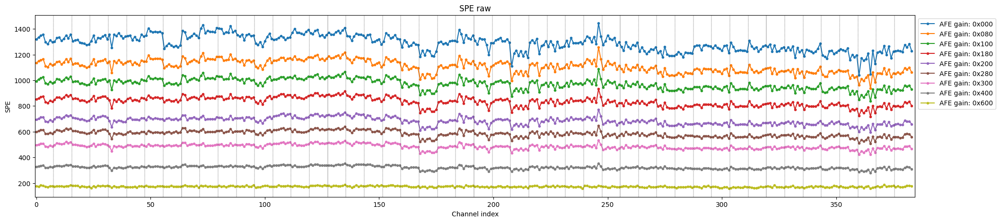

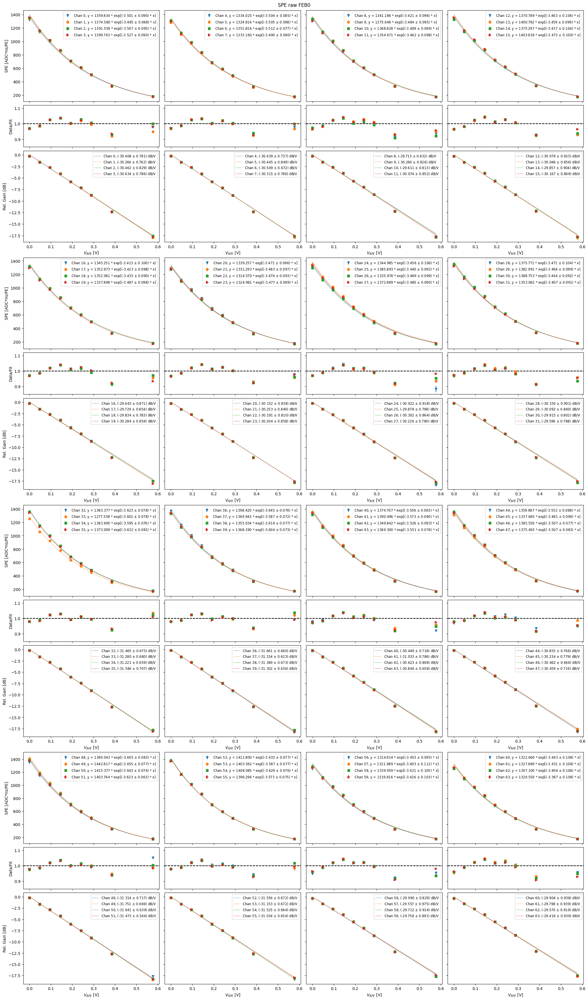

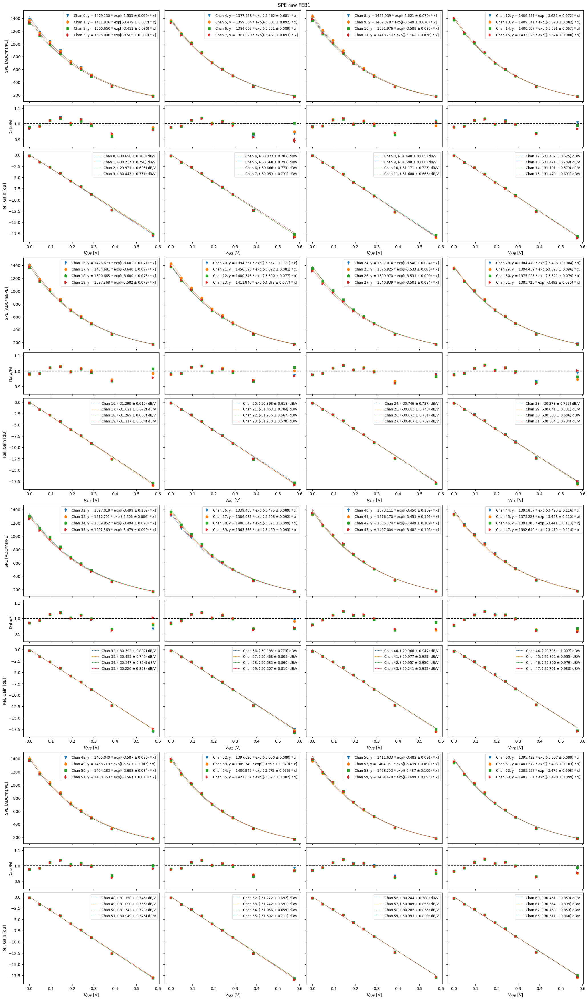

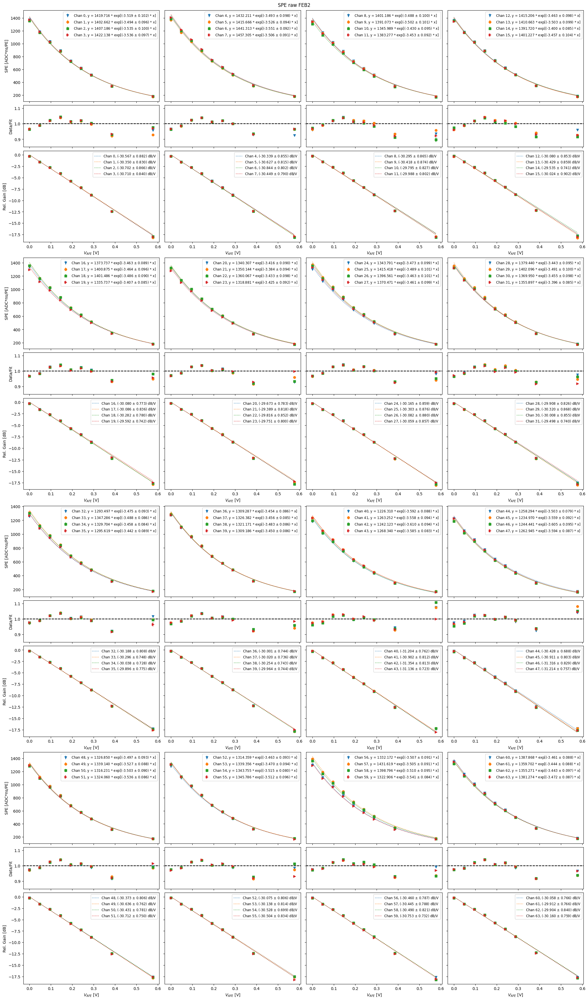

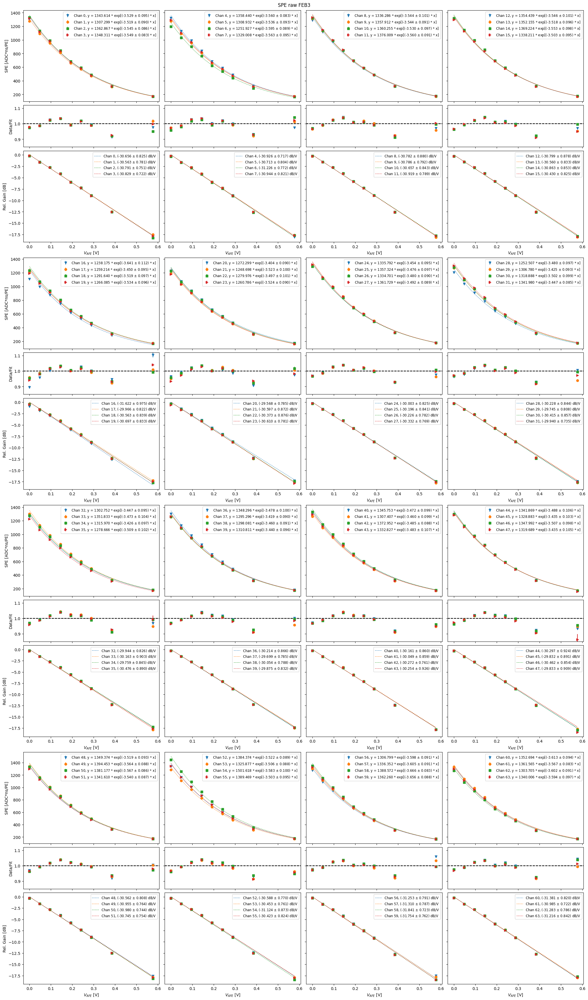

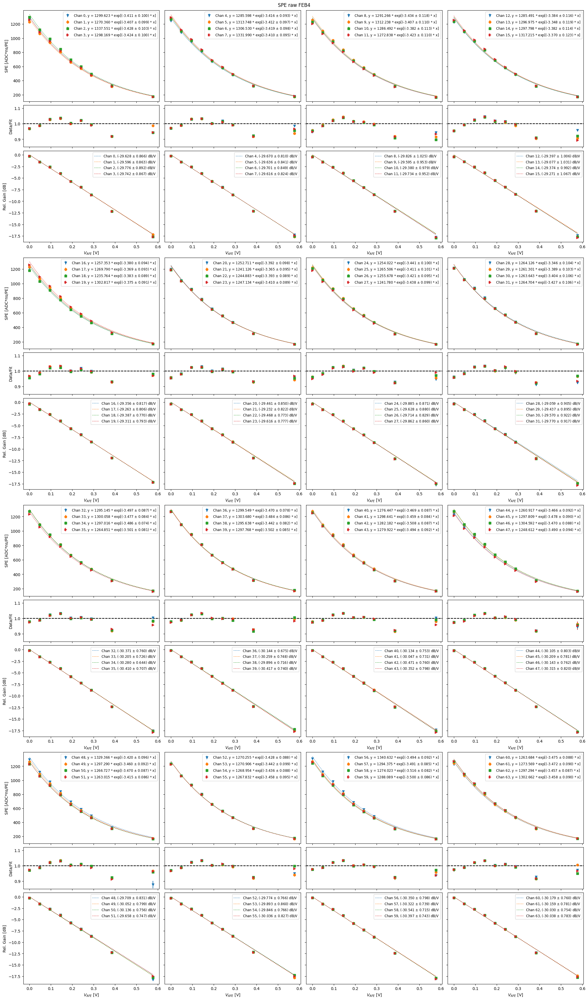

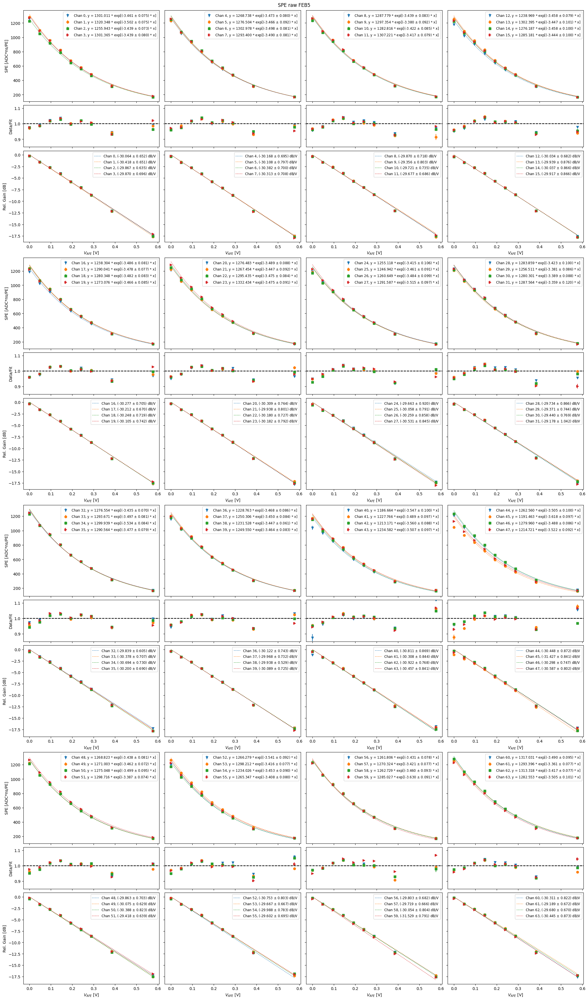

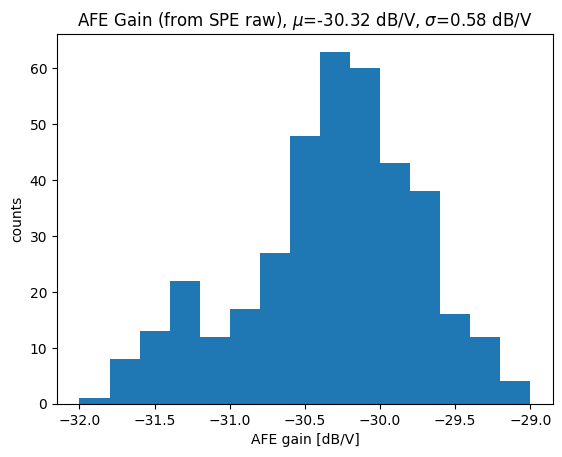

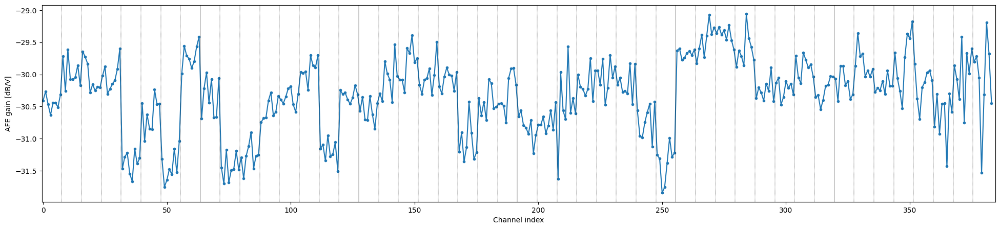

In [5]:
dBperV1, x1, ratio_array1 = displayItem('calibRaw', 'SPE raw')

In [6]:
# dBperV2, x2, ratio_array2 = displayItem('calibAdj1', 'SPE stock correction, both $T_{CMB}$ and $T_{FEB}$')

In [7]:
# dBperV3, x3, ratio_array3 = displayItem('calibAdj2', 'SPE stock correction, only $T_{CMB}$')

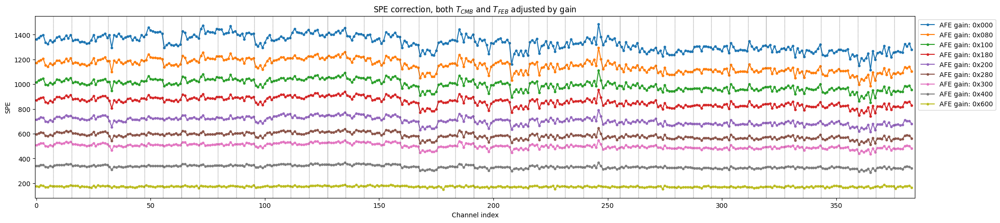

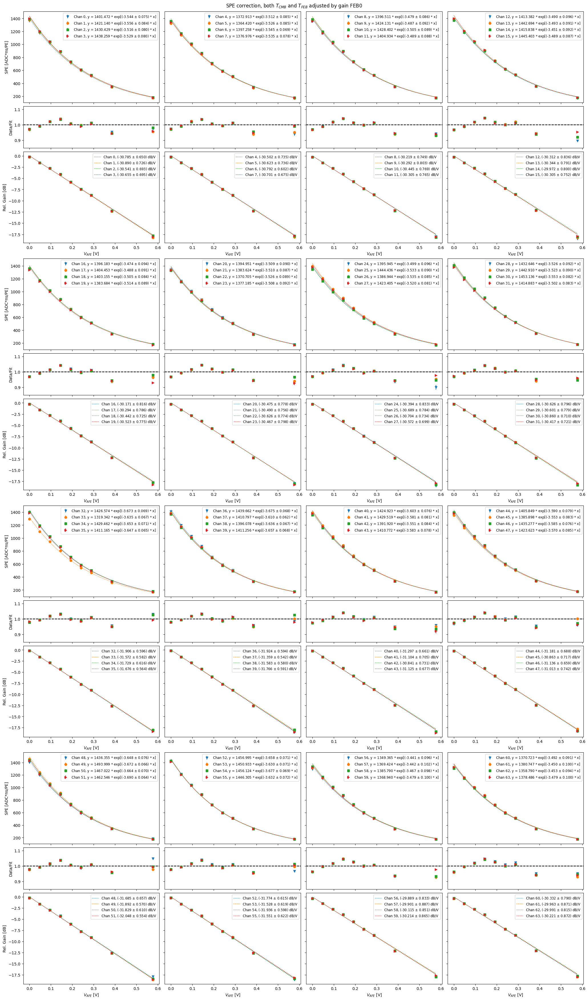

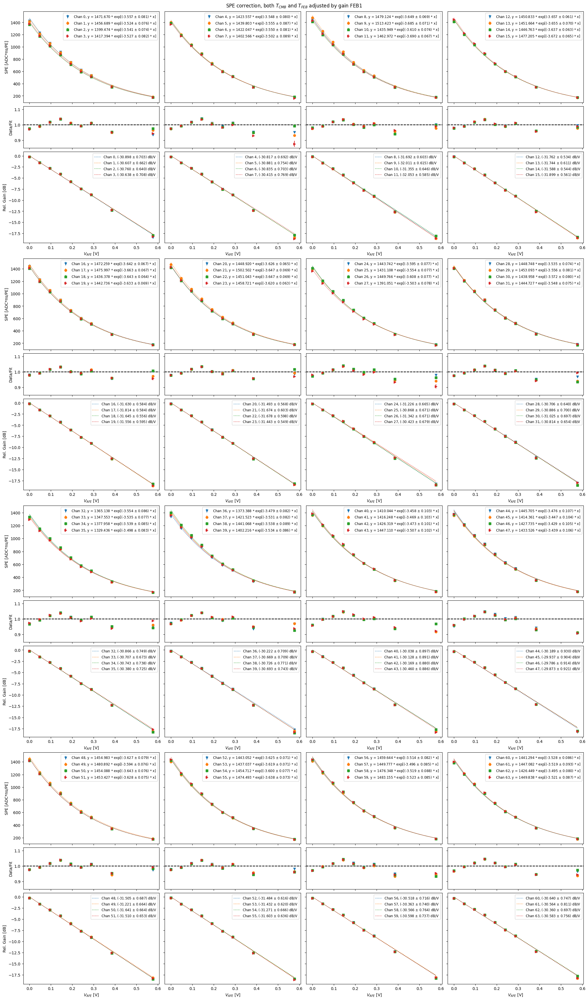

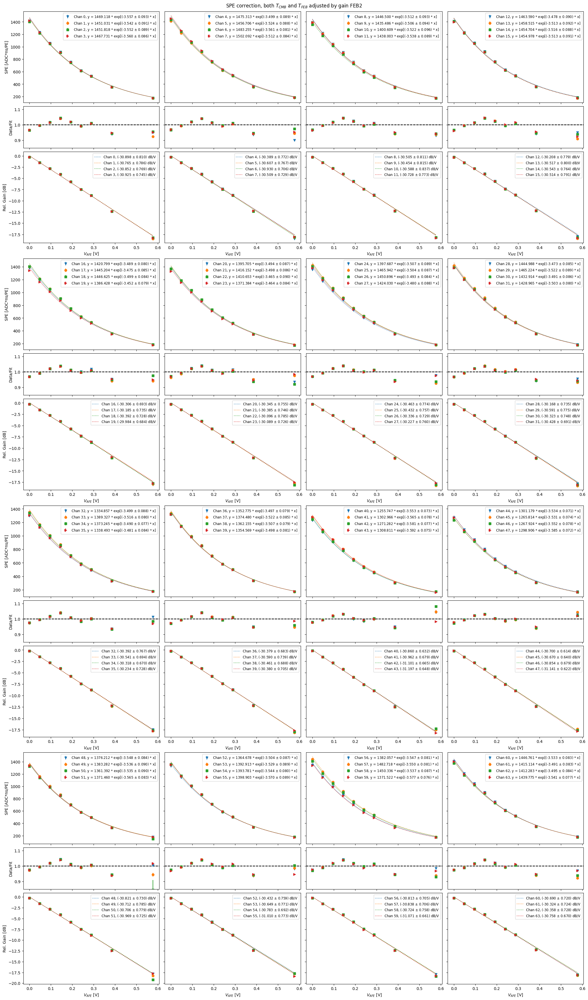

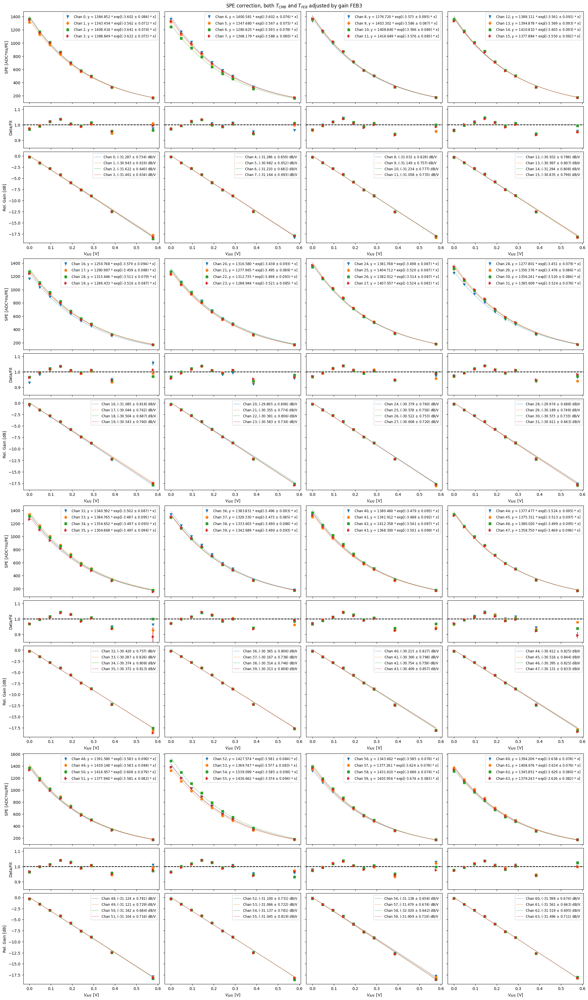

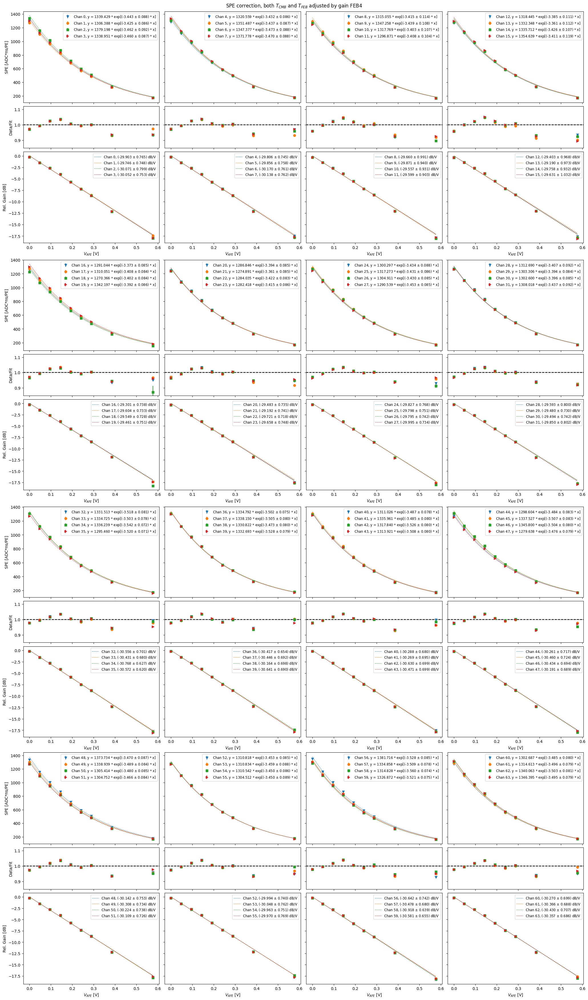

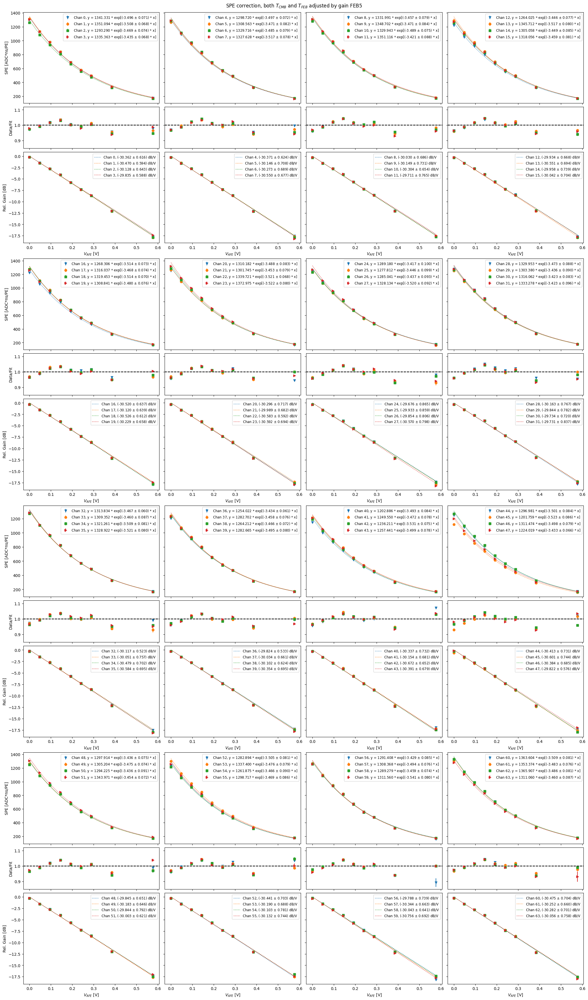

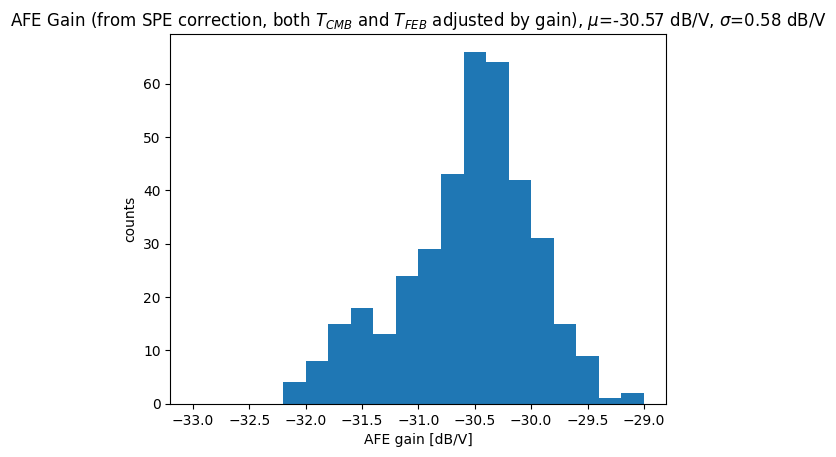

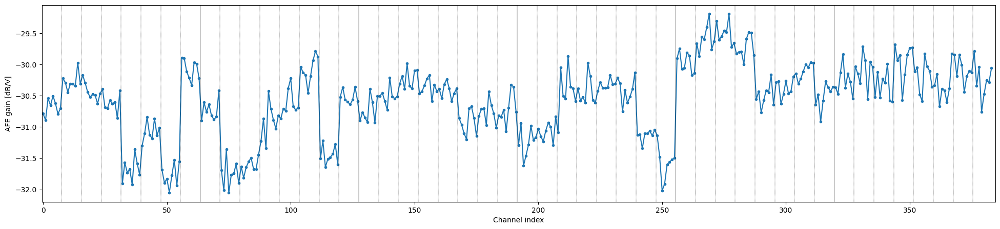

In [8]:
dBperV4, x4, ratio_array4 = displayItem('calibAdj3', 'SPE correction, both $T_{CMB}$ and $T_{FEB}$ adjusted by gain')

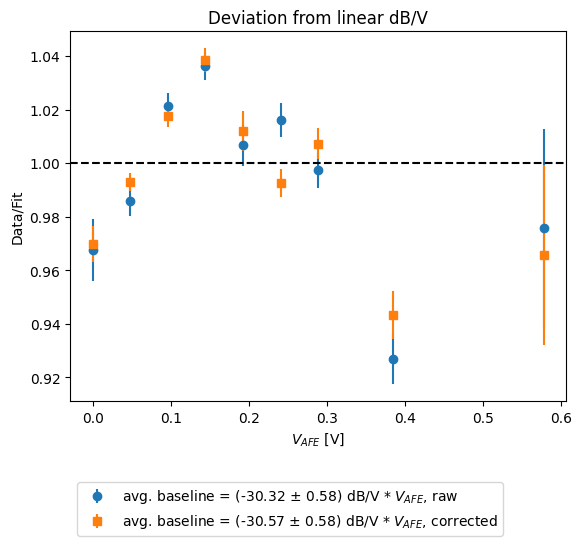

In [9]:
plt.figure()
plt.errorbar(x1, np.mean(np.array(ratio_array1), axis=1), np.std(np.array(ratio_array1), axis=1), marker='o', linestyle='none', label='avg. baseline = (%.2f $\pm$ %.2f) dB/V * $V_{AFE}$, %s'%(np.mean(dBperV1), np.std(dBperV1), 'raw'))
plt.errorbar(x4, np.mean(np.array(ratio_array4), axis=1), np.std(np.array(ratio_array4), axis=1), marker='s', linestyle='none', label='avg. baseline = (%.2f $\pm$ %.2f) dB/V * $V_{AFE}$, %s'%(np.mean(dBperV4), np.std(dBperV4), 'corrected'))
plt.axhline(y=1., color='k', linestyle='--')
plt.title("Deviation from linear dB/V")
plt.xlabel("$V_{AFE}$ [V]")
plt.ylabel("Data/Fit")
plt.legend(loc='upper left', bbox_to_anchor=(0.0, -0.2))

Viewing from the CMB and FEB temperature, the runs at 0x180 (4th from left, ~ 0.15V), 0x600 (last), 0x280 (~ 0.25V), 0x100 (3rd from left) are at slightly different temperatures than the others. On average, points at 0x600 (last) and 0x280 (~0.25V) have ~2 degC lower CMB temperature and ~4 degC lower FEB temperature. For them, CMB corrections are 2*(-7)/400 ~ -3.5% and FEB corrections are 4*(-1)/400 ~ -1% compared to the others. The points at ~0.1V and ~0.15V should be roughly reduced by ~2% in total. Considering the slight shift of baseline, the above plot can be understood relatively well.

What if throwing away AFE gain settings at 0x600 as well?